In [237]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
import mpld3
mpld3.disable_notebook()

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.integrate import odeint
# mpl.rc('text', usetex = True)

In [257]:
# constants

# flow rate let is be 100um/min
Q = (1e-7) /60 #m^3s-1
# Q = 1.6e-6
channel_width = 1e-4 #m
channel_height = 3e-4 #m
channel_length = 0.1 #m
d = 1e-6 # m (1um)
visc_water = 0.89e-3 #Pa s - compatible
viscosity = 3*visc_water #approx
mu0 = np.pi*4e-7 #H m^-1 - compatible
bead_dens = 2000 # kg m^-3
m_p = 1/6 * np.pi * d**3 * bead_dens #kg
print(m_p)

1.0471975511965977e-15


# 1 Way Interraction: Fluid --> Bead


The bead velocity under magnetic field should be: 

\begin{equation}
    \mathbf{u} = \mathbf{u}_m + \mathbf{u}_f
\end{equation}

where $\mathbf{u}_m = u_m\hat{y}$ is the velocity due to the magnetic field and $\mathbf{u}_f= u_f\hat{x}$ should be of the parabolic form of the Poiseuille flow between two plates::

\begin{align}
    &\mathbf{u}_f = \frac{1}{2\eta}\partial_x P(y^2 - h^2)\hat{x},\; g\in [-h,h] &\text{or}& &\mathbf{u}_f = \frac{1}{2\eta}\partial_x P(y^2 - hy)\hat{x},\; g\in [0,h].
\end{align}

The gradient of $P$ can be expressed in terms of the change in pressure: $\partial_xP = \Delta P/L$.

## Force approximations

Simple Newton for motion of a single bead:

\begin{equation}
   \ddot{\mathbf{X}} = \frac{1}{m_p}(\mathbf{F}_m + \mathbf{F}_{hd} ),
\end{equation}

where we very roughly estimate the hydrodynamical pressure $\mathbf{F}_{hd}$ on the bead due to the fluid by:

\begin{equation}
    \mathbf{F}_{hd} \approx -V_p\partial_xP + \mathbf{F}_{d},
\end{equation}

and the drag force we approximate by $\mathbf{F}_{d} \approx 3\pi\eta d\mathbf{u}$ and the magnetic force $\mathbf{F}_{m}$ by:

\begin{equation}
    \mathbf{F}_{m} = V_p\frac{(\chi_p - \chi_f)}{\mu_0}(\mathbf{B}\cdot\nabla)\mathbf{B}.
\end{equation}

Approximate motion:

\begin{equation}
   \ddot{\mathbf{X}} = \frac{1}{\rho_p}\frac{(\chi_p - \chi_f)}{\mu_0}(\mathbf{B}\cdot\nabla)\mathbf{B} -\frac{1}{\rho_p}\frac{\Delta P}{L} + \frac{1}{m_p}3\pi\eta d\mathbf{u},
\end{equation}

## Migration velocity - a quick approximation

Equating $\mathbf{F}_d = \mathbf{F}_m$, we get that the migration velocity should follow:

\begin{equation}
    \mathbf{u}_m = \frac{1}{\mu_0}\frac{d^2(\chi_p - \chi_f)}{18\eta} (\mathbf{B}\cdot\nabla)\mathbf{B}.
\end{equation}

### Fitting the magnetic field strength:

popt =  [  0.18576433 156.46453751]


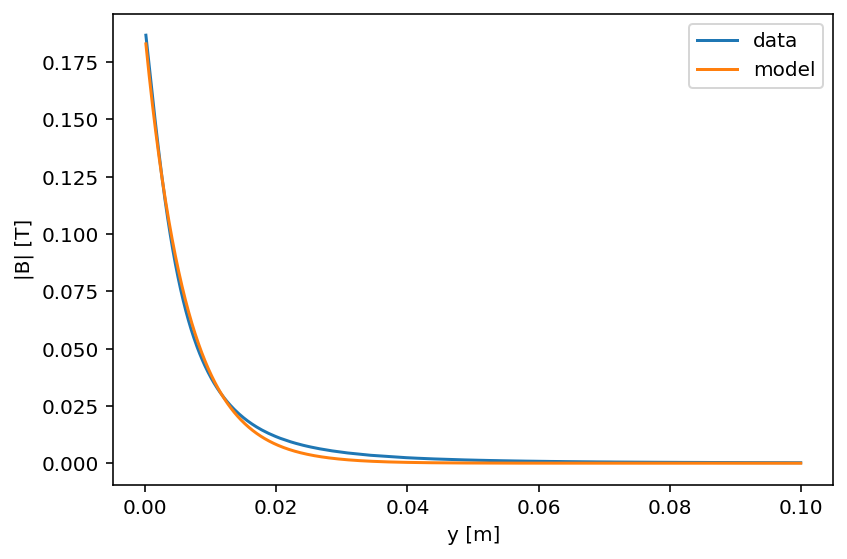

In [119]:
# Estimations from: https://www.intemag.com/magnet-calculations-flux-vs-distance-rectangular-magnets
# for a 30x10x10 mm magnet with sufrcafe gauss=5000.

data = np.array(np.loadtxt('mag_strength.txt'))

distance = data[0::2]
strength = data[1::2] / 10000 # in T now


def test_fun(x, a, b):
    return a*np.exp(-b*x)

popt, pcov = curve_fit(test_fun, distance, strength)

print('popt = ', popt)

plt.plot(distance, strength, label='data')
plt.plot(distance, test_fun(distance, *popt), label='model')
plt.xlabel('y [m]')
plt.ylabel('|B| [T]')
plt.legend()
plt.tight_layout()
plt.show()

5.339999999999999 Pa
1.55 s


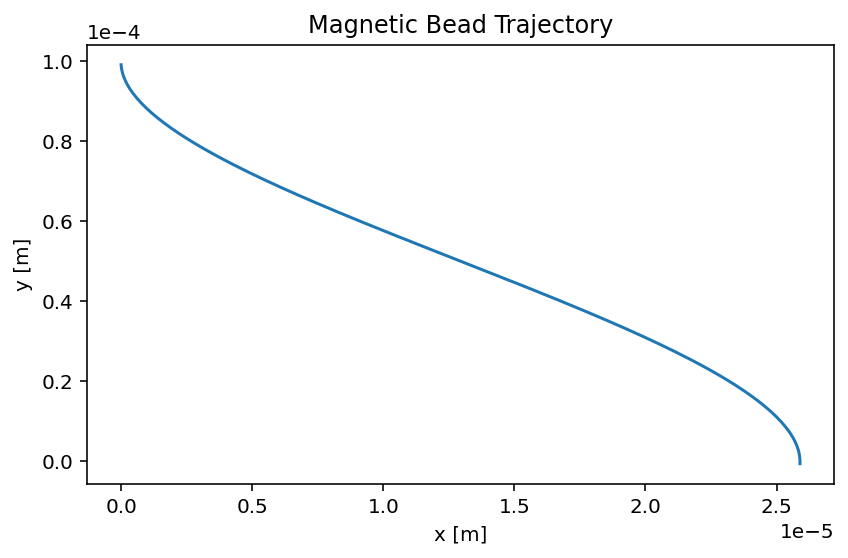

In [240]:
# with this assumption:
def der_test_fun(y,a,b):
    return -b*a*np.exp(-b*y)

# 'force field':
def test_fun_ff(y,a,b):
    return test_fun(y,a,b)*der_test_fun(y,a,b)

# migration vel assuming chi_f=0
def u_m(y, chi, a, b):
    return (1/mu0)*d**2 *(chi/(18*viscosity)) * test_fun_ff(y, a, b)

# pressure proportional to QR_H
def dP(flowrate, w, L):
    Rh = 12*viscosity*L / w**3
    return flowrate * Rh

# vel profile (Poiseuille)
def u_f(y, flowrate, w, L):
    return 0.5*(1/viscosity)*(dP(flowrate,w,L)/L)*(w*y - y**2)



y = np.linspace(channel_width - no_slip, 0, 1000)

no_slip = channel_width/100
wall_thickness = 1e-3 # =1 mm


# for our flow rate
fr = 1*Q
print(dP(fr, channel_width, channel_length), 'Pa')
bead_pos = [[0], [channel_width - no_slip]]
k=0
dt = 0.01
for i in range(100000):
    bead_pos[0].append(bead_pos[0][i] + dt * u_f(bead_pos[1][i], fr, channel_width, channel_length))
    bead_pos[1].append(bead_pos[1][i] + dt * u_m(bead_pos[1][i] + wall_thickness, 1, *popt))
    k += 1
    if bead_pos[1][i] <= 0:
        break
    else:
        continue
print(k*dt, 's')

plt.plot(bead_pos[0], bead_pos[1])
plt.xlabel('x [m]')
plt.ylabel('y [m]')
plt.title('Magnetic Bead Trajectory')
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
# plt.ticklabel_format(style='sci')
plt.tight_layout()
plt.savefig('init_trajectory.png', dpi=300)
plt.show()

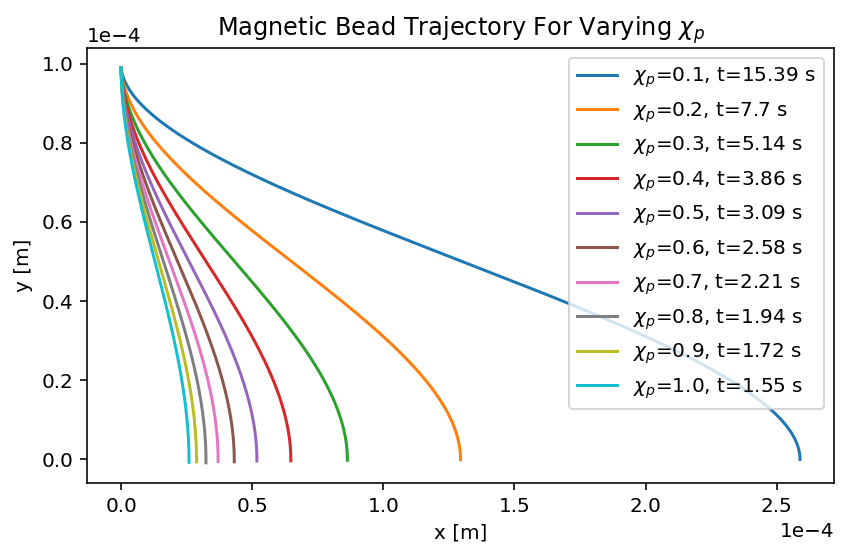

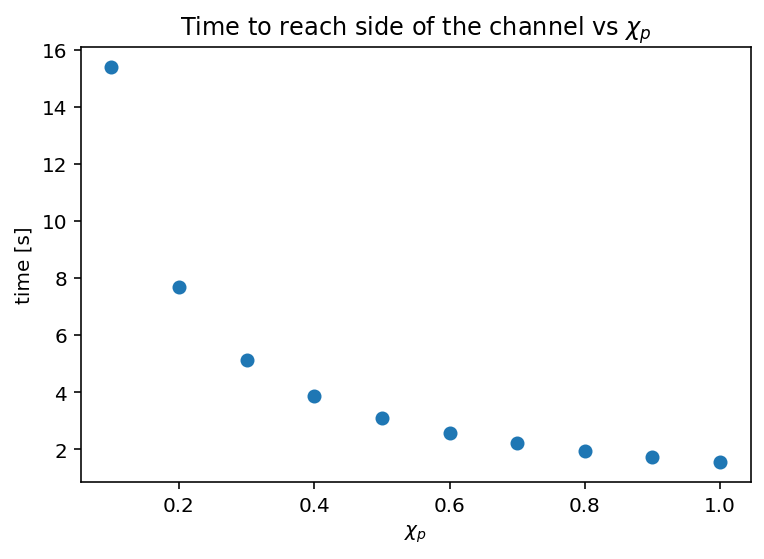

In [256]:
def approx_path(init_pos, dt, w, L, wall, Q, chi, a, b):

    k=0
    for i in range(100000):
        init_pos[0].append(init_pos[0][i] + dt * u_f(init_pos[1][i], Q, w, L))
        init_pos[1].append(init_pos[1][i] + dt * u_m(init_pos[1][i]+wall, chi, a,b))
        k += 1
        
        if init_pos[1][i] <= 0:
            break
        elif init_pos[0][i] >= channel_length:
            break
        else:
            continue
    return init_pos, k*dt


# Susceptibility of Fe3O4 beads from literature is 0.22-0.32 ish. Larger variation:
bead_sus = np.linspace(0.1,1,10)

time = np.empty(len(bead_sus))
for i in range(len(bead_sus)):
    init_pos = [[0], [channel_width - no_slip]]
    bead_pos, time[i] = approx_path(init_pos, 0.01, channel_width, channel_length, wall_thickness, Q, bead_sus[i], *popt)
    plt.plot(bead_pos[0], bead_pos[1], label=r'$\chi_p$={}, t={} s'.format(round(bead_sus[i],1), time[i]))
    

plt.xlabel('x [m]')
plt.ylabel('y [m]')
plt.legend()
plt.title(r'Magnetic Bead Trajectory For Varying $\chi_p$')
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
# plt.ticklabel_format(style='sci')
plt.tight_layout()
plt.savefig('trajectory_chi.png', dpi=300)
plt.show()

plt.scatter(bead_sus, time)
plt.xlabel(r'$\chi_p$')
plt.ylabel(r'time [s]')
plt.title(r'Time to reach side of the channel vs $\chi_p$')
plt.savefig('time_chi.png', dpi=300)
plt.show()

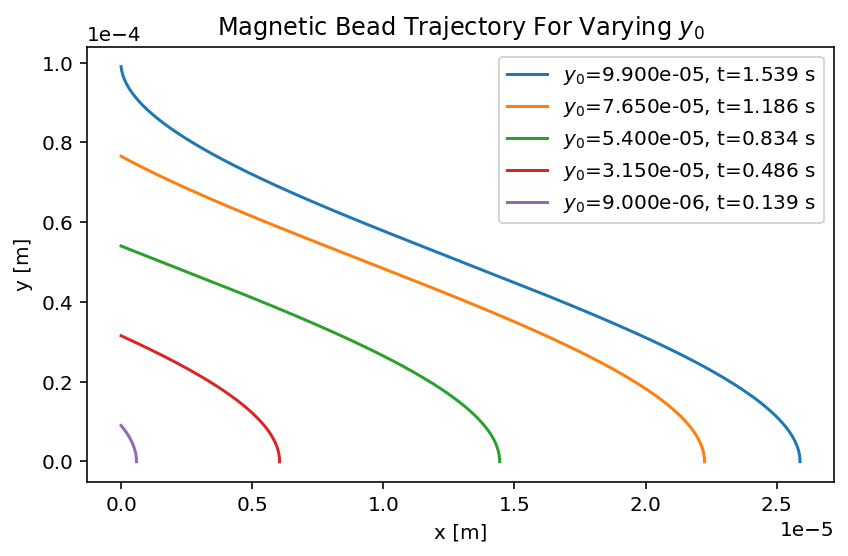

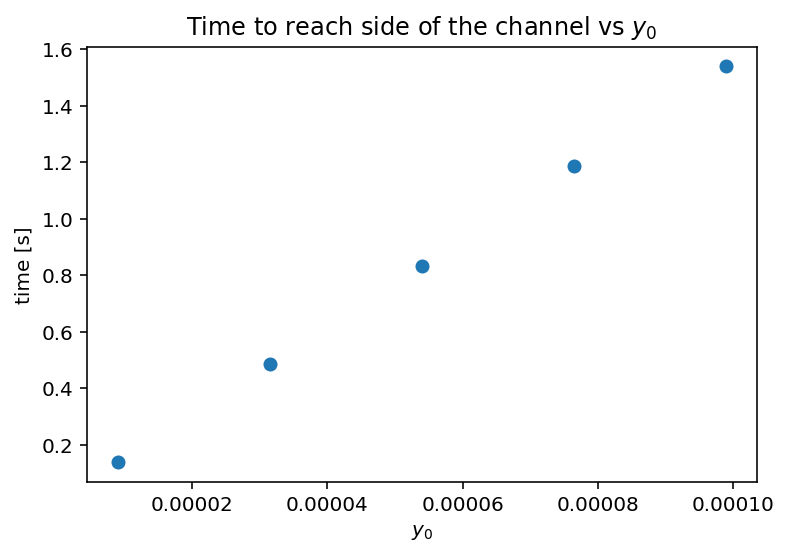

In [255]:
init_y = np.linspace(channel_width - no_slip, channel_width/10 - no_slip, 5)
time = np.empty(len(init_y))
for i in range(len(init_y)):
    init_pos = [[0], [init_y[i]]]
    bead_pos, time[i] = approx_path(init_pos, 0.001, channel_width, channel_length, wall_thickness, Q, 1, *popt)
    plt.plot(bead_pos[0], bead_pos[1], label=r'$y_0$={:0.3e}, t={} s'.format(init_y[i], time[i]))
    

plt.xlabel('x [m]')
plt.ylabel('y [m]')
plt.legend()
plt.title(r'Magnetic Bead Trajectory For Varying $y_0$')
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
plt.tight_layout()
plt.savefig('trajectory_y0.png', dpi=300)
plt.show()

plt.scatter(init_y, time)
plt.xlabel(r'$y_0$')
plt.ylabel(r'time [s]')
plt.title(r'Time to reach side of the channel vs $y_0$')
plt.savefig('time_y0.png', dpi=300)
plt.show()

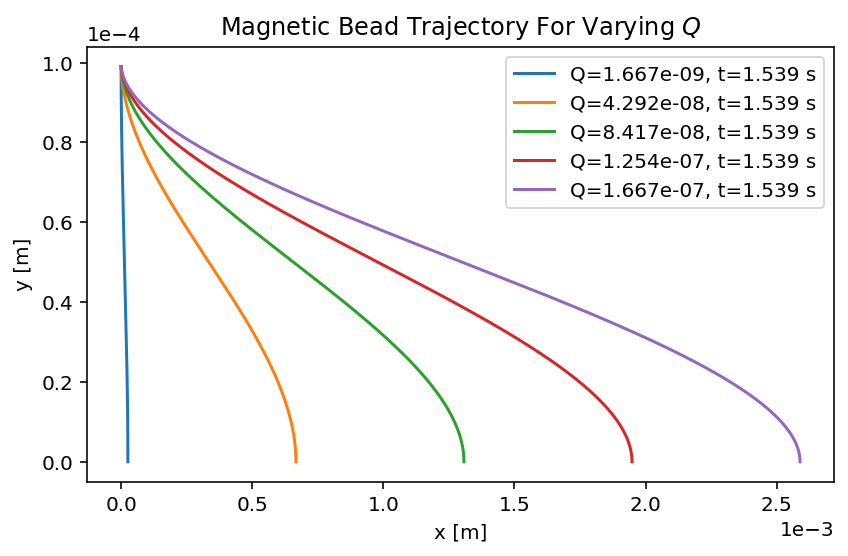

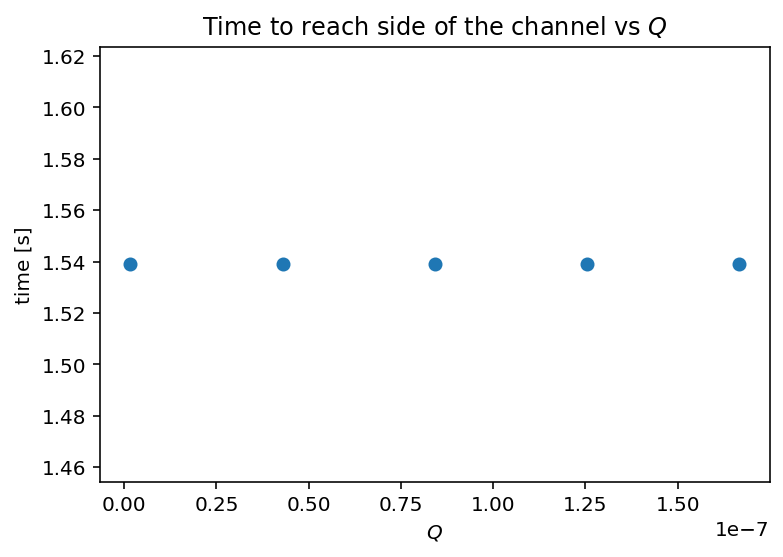

In [254]:
flowrate = np.linspace(Q, 100*Q, 5)
time = np.empty(len(flowrate))
for i in range(len(flowrate)):
    init_pos = [[0], [channel_width - no_slip]]
    bead_pos, time[i] = approx_path(init_pos, 0.001, channel_width, channel_length, wall_thickness, flowrate[i], 1, *popt)
    plt.plot(bead_pos[0], bead_pos[1], label='Q={:0.3e}, t={} s'.format(flowrate[i], time[i]))
    

plt.xlabel('x [m]')
plt.ylabel('y [m]')
plt.legend()
plt.title(r'Magnetic Bead Trajectory For Varying $Q$')
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
plt.tight_layout()
plt.savefig('trajectory_Q.png', dpi=300)
plt.show()

plt.scatter(flowrate, time)
plt.xlabel(r'$Q$')
plt.ylabel(r'time [s]')
plt.title(r'Time to reach side of the channel vs $Q$')
plt.savefig('time_Q.png', dpi=300)
plt.show()

#### Mixing along the depth of the channel

Now we would like to suppose that we have identical magnets arranged in an alternating manner at the top and bottom of the channel. Each of them have the same magnetic field stregth profile (use test_fun() again).

Supposing our channel has a lneght $L$ and we want to have i magnets of 'length' $l_m$, separated by $l_m$ along the length of the channel (x_axis), we would place them at:

\begin{align}
    &m_1: (x_1\in[0, l_m], z_1=0), & &m_2: (x_2\in[2l_m, 3l_m], z_2=h), & &m_3: (x_3\in[4l_m, 5l_m], z_3=0), & &m_4: (x_4\in[6l_m, 7l_m], z_4=h),\\
    &\dots  & &m_i: (x_i\in[2il_m, (2i+1)l_m], z_i=\frac{j^{2i}+1}{2}),
\end{align}

with $i=0,1\dots n$.

In [232]:
# the wall_thickness = 1e-3, on both top and bottom.

# want: 
# - bead travelling a distance of straight_x in the x direction.
# - bead experiencing alternating magnetic field depending on its x-pos

# We asume again a 2D simplification, with w = height of channel.. 
# but the actual channel is taller than wider and smaller dimension dominates.
# so for now we just let the pressure be the same, w=width of channel:
def dP(flowrate, w, L):
    Rh = 12*viscosity*L / w**3
    return flowrate * Rh

# Velocity profile is the same in the z direction (height).. 
# but it is less 'steep' and wider, as here w=h and h>w:
def u_f(z, flowrate, h, L):
    return 0.5*(1/viscosity)*(dP(flowrate,h,L)/L)*(h*z - z**2)


#each magnet 'takes up' 2 Lm:
L_m = 0.01 # = 10mm
num_magnets = int(channel_length/(2*L_m))
print(num_magnets)
x_start_stop = np.zeros((num_magnets,2)) 
for i in range(len(x_start_stop)):
    x_start_stop[i] = [2*i*L_m, (2*i+1)*L_m]

print(x_start_stop)

def approx_mixing_path(init_pos, dt, h, L, wall, Lm, Q, chi, a, b):
    
    # alternating force field with gaps
    # zero in gaps, nonzero where magnets are
    def mixing_ff(x, z, Lm, L, a, b):
        
        ff = test_fun(z,a,b)*der_test_fun(z,a,b)
        
        num_magnets = int(L/(2*Lm))
        
        x_start_stop = np.zeros((num_magnets,2)) 
        
        for i in range(len(x_start_stop)):
            x_start_stop[i] = [2*i*Lm, (2*i+1)*Lm]
            
        for i in range(len(x_start_stop)):
            if i % 2 == 0:
                sign = 1
            elif i % 2 != 0:
                sign = -1
            if x_start_stop[i][0]<= x <= x_start_stop[i][1]:
                out = sign*ff/100
            elif x_start_stop[i][0]>= x >= x_start_stop[i][1]:
                out = 0
                
        return out

    # migration velocity
    def u_m(x, z, Lm, L, chi, a, b):
        return (1/mu0)*d**2 *(chi/(18*viscosity)) * mixing_ff(x, z, Lm, L, a, b)


    k=0
    for i in range(100000):
        init_pos[0].append(init_pos[0][i] + dt * u_f(init_pos[1][i], Q, h, L))
        init_pos[1].append(init_pos[1][i] + dt * u_m(init_pos[0][i], init_pos[1][i] + wall, Lm, L, chi, a, b))
        k += 1
        if init_pos[1][i] <= 0:
            break
        elif init_pos[0][i] >= channel_length:
            break
        else:
            continue
            
    return init_pos, k*dt

init_pos = [[0], [channel_height-channel_height/10]]

bead_pos, time = approx_mixing_path(init_pos, 0.01, channel_height, channel_length, wall_thickness, L_m, 10*Q, 1, *popt)

print(time, 's')

plt.plot(init_pos[0], init_pos[1])
plt.plot(init_pos[0][0], init_pos[1][0], 'x')
plt.xlabel('x [m]')
plt.ylabel('y [m]')
# plt.ticklabel_format(style='sci')
plt.tight_layout()
plt.show()

5
[[0.   0.01]
 [0.02 0.03]
 [0.04 0.05]
 [0.06 0.07]
 [0.08 0.09]]


UnboundLocalError: local variable 'out' referenced before assignment

#### Two immiscible fluids

flowrate and thus also the velocity profile changes after crossing the intreface.

Two velocity profiles:

\begin{equation}
    u_1 = 
\end{equation}

but

\begin{equation}
    u_2 = 
\end{equation}


....
....

###  Solving Newton

We have:

\begin{equation}
   \ddot{\mathbf{X}} = \frac{1}{\rho_p}\frac{(\chi_p - \chi_f)}{\mu_0}(\mathbf{B}\cdot\nabla)\mathbf{B} -\frac{1}{\rho_p}\frac{\Delta P}{L} + \frac{1}{m_p}3\pi\eta d\dot{\mathbf{X}},
\end{equation}

or 

\begin{align}
    \ddot{\mathbf{x}} &= -\frac{1}{\rho_p}\frac{\Delta P}{L} + \frac{1}{m_p}3\pi\eta d\dot{\mathbf{x}}\\
    \ddot{\mathbf{y}} &= \frac{1}{\rho_p}\frac{(\chi_p - \chi_f)}{\mu_0}(\mathbf{B}\cdot\nabla)\mathbf{B} + \frac{1}{m_p}3\pi\eta d\dot{\mathbf{y}}
\end{align}

should drag be in both components..?

In [121]:
def F_pressure(flowrate, w, L):
    return -(1/bead_dens)*(dP(flowrate, w, L)/L)

def F_drag(vel):
    return 3*np.pi*viscosity*d*vel / m_p

def F_mag(y, mag_sus_p, a, b):
    return (1/mu0)*( 1/6 * np.pi * d**3)*mag_sus_p*test_fun_ff(y,a,b)



In [261]:
def Newton_bead(X, t, *params):
    """ Computes the derivative of the state vector
    X = (x,y,u,v) = ('pos.', 'vel.') of a magnetic bead with
    mass m_p, experiencing foce due to ext. mag. field F_mag and 
    due to fluid flow F_pressure+F_drag (array/list or a function).
    
    Give paramaters as: [L, chi1, chi2, ]
    According to Newton's E.o.M. Returns dX/dt.
    """
    
    # unpack components of position and velocity
    x, y = X[0], X[1]
    u, v = X[2], X[3]
    

#     if isinstance(params[-1], types.FunctionType) is True:
#         print('B-field given as function')
#         B = params[-1](x,y)
#     else:
#         B = params[-1]

    # unpack parameters
    flowrate, w, L, wall, mag_sus_p, a, b = params[0], params[1], params[2], params[3], params[4], params[5], params[6]
    
    ddx = F_pressure(flowrate, w, L)
    ddy = F_mag(y+wall, mag_sus_p, a, b) + F_drag(v)
    
    return np.array([u, v, ddx, ddy])

/Users/davidbern/anaconda3/lib/python3.8/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


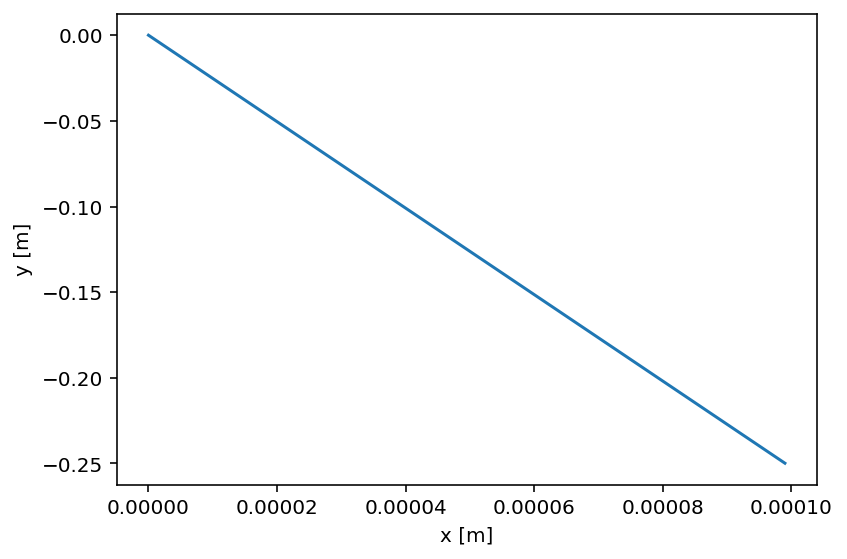

In [264]:
params = [Q, channel_width, channel_length, wall_thickness, 1, *popt]

# init_pos[0].append(init_pos[0][i] + dt * u_f(init_pos[1][i], Q, w, L))
#         init_pos[1].append(init_pos[1][i] + dt * u_m(init_pos[1][i]+wall, chi, a,b))
#         k += 1

# initial conditions
bead_pos = [0, channel_width - 0.01]
X0 = np.array(bead_pos)
V0 = np.array([u_f(X0[1], Q, channel_width, channel_length), 0])
initial_conditions = np.concatenate((X0, V0))

# time array 5 second divided into 5000 points
t_arr = np.linspace(0, 2, 2000)

sol_arr = odeint(Newton_bead, initial_conditions, t_arr, args=tuple(params))
positions = sol_arr[:,:2]

plt.plot(positions[0], positions[1])
plt.xlabel('x [m]')
plt.ylabel('y [m]')
# plt.ticklabel_format(style='sci')
plt.tight_layout()
plt.show()

In [ ]:
# Susceptibility of Fe3O4 beads from literature is 0.22-0.32 ish. Larger variation:
bead_sus = np.linspace(0.2,1,10)

5.339999999999999 Pa
122.91 s


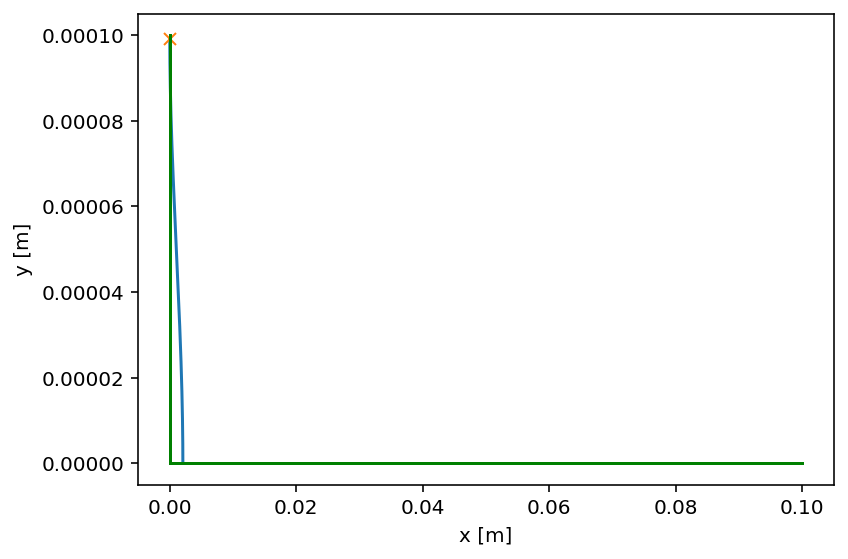

In [191]:
# with this assumption:
def der_test_fun(y,a,b):
    return -b*a*np.exp(-b*y)

# 'force field':
def test_fun_ff(y,a,b):
    return test_fun(y,a,b)*der_test_fun(y,a,b)

# migration vel assuming chi_f=0
def u_m(y, chi, a, b):
    return (1/mu0)*d**2 *(chi/(18*viscosity)) * test_fun_ff(y, a, b)

# pressure proportional to QR_H
def dP(flowrate, w, L):
    Rh = 12*viscosity*L / w**3
    return flowrate * Rh

# vel profile (Poiseuille)
def u_f(y, flowrate, w, L):
    return 0.5*(1/viscosity)*(dP(flowrate,w,L)/L)*(w*y - y**2)

# for our flow rate
print(dP(Q, channel_width, channel_length), 'Pa')



#----------------------------------

init_pos = [[0], [channel_width-no_slip]]

k=0
dt=0.001

for i in range(1000000):
    init_pos[0].append(init_pos[0][i] + dt*u_f(init_pos[1][i], Q, channel_width, channel_length))
    init_pos[1].append(init_pos[1][i] + dt*u_m(init_pos[1][i] + wall_thickness, 1, *popt))
    
    k += 1
    
    if init_pos[1][i] <= 0:
        break
    elif init_pos[0][i] >= channel_length:
        break
    else:
        continue

print(k*dt, 's')
# r1 = np.linspace(0,channel_length,2)
# r2 = np.linspace(0,channel_width,2)

plt.plot(init_pos[0], init_pos[1])
plt.plot(init_pos[0][0], init_pos[1][0], 'x')
# plt.plot([0,0], r2, 'g')
# plt.plot(r1,[0,0], 'g')
plt.xlabel('x [m]')
plt.ylabel('y [m]')
# plt.ticklabel_format(style='sci')
plt.tight_layout()
plt.show()


In [212]:
print(1%2)

1
